In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd



# Basic debugging functions
def print_tensor_details(tensor):
    print('instance before debug: ', tensor)
    print('shape: ', tensor.shape)
    print('size(): ', tensor.size())
    print('device: ', tensor.device)
    print('dtype: ', tensor.dtype)
    print('grad: ', tensor.grad)
    print('grad_fn: ', tensor.grad_fn)
    # print('Tensor Row/Col', tensor[:, :])
    # print('Tensor Col-2nd', tensor[:, 1])
    # print('Tensor Row-2nd', tensor[1, :])
    print('instance after debug: ', tensor)
    pass


In [2]:
# Random initializations / seeding
## 2D
tensor_rand_1_1 = torch.randn(1, 1, requires_grad=True)
## 1D
tensor_rand_1 = torch.randn(1, requires_grad=True)
## 3D
tensor_rand_1_1_1 = torch.randn(1, 1, 1, requires_grad=True)

# Now print those:
print(tensor_rand_1_1)
print(tensor_rand_1)
print(tensor_rand_1_1_1)

tensor([[-0.4509]], requires_grad=True)
tensor([0.7718], requires_grad=True)
tensor([[[-0.3650]]], requires_grad=True)


## Linear Regression - Manual
Now let's begin Linear Regression (using crafted data)

In [3]:
# num data points
N = 10

# Assuming only 1 dimension per data-point (i.e. 1 col), and 1 predicted value per row
## In general size of X --> [N_data_points X  N_features]
## No grads required for the input
X = torch.randn(N, 1)
#print("X= ", X)

# creating data as per y = 2x + 1
## Note the dimension of W would be [N_features X N_outputs_per_row]
W_true = torch.tensor([2.0]).reshape(1,1)

## Bias (a row-vect) will have dimensions as [1 x N_outputs_per_row]
b_true = torch.tensor([1.0]).reshape(1)

## Predicted: Y_hat will have dimension: [N_data_point X N_outputs_per_row]
Y_source = X @ W_true + b_true
#print("Y_source= ", Y_source)

 ## With some noise, so the regression can be understood!
Y_noise = torch.randn(N, 1) * 0.1
Y_true = Y_source + Y_noise
#print("Y_true(noise)= ", Y_true)

## Some Retro analysis on the crafted data
data_rmse = ((Y_true - Y_source)**2).mean().sqrt()

In [4]:
# About the crafted data
## Print the Source and True values
print("W_true= ", W_true)
print("b_true= ", b_true)
print("Data RMSE: ", data_rmse)
aggregate = torch.concat((X, Y_source, Y_noise, Y_true), dim=1)
print("\nAGGREGATE:\n        X        Y_src     Y_noise    Y_true\n", aggregate)

W_true=  tensor([[2.]])
b_true=  tensor([1.])
Data RMSE:  tensor(0.0811)

AGGREGATE:
        X        Y_src     Y_noise    Y_true
 tensor([[ 1.2689e+00,  3.5379e+00,  7.2682e-02,  3.6105e+00],
        [-1.6712e-01,  6.6575e-01, -1.2709e-01,  5.3867e-01],
        [-1.3383e+00, -1.6766e+00,  1.0537e-02, -1.6661e+00],
        [-1.1452e+00, -1.2903e+00,  4.6334e-02, -1.2440e+00],
        [ 1.6676e+00,  4.3353e+00, -1.6447e-02,  4.3188e+00],
        [ 1.0112e+00,  3.0224e+00, -1.8469e-03,  3.0205e+00],
        [ 6.3717e-02,  1.1274e+00,  1.2259e-01,  1.2500e+00],
        [ 4.9454e-01,  1.9891e+00, -1.3151e-01,  1.8576e+00],
        [-2.7185e-01,  4.5629e-01,  6.5460e-03,  4.6284e-01],
        [ 9.7624e-01,  2.9525e+00,  9.6843e-02,  3.0493e+00]])


[]

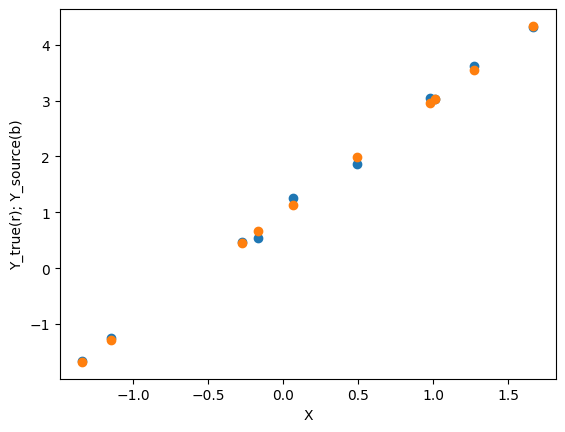

In [5]:
# About the crafted data
## SCATTER PLOT
plt.scatter(x=X, y=Y_true, colorizer='r')
plt.scatter(x=X, y=Y_source, colorizer='b')
plt.xlabel('X')
plt.ylabel('Y_true(r); Y_source(b)')
plt.plot()

In [6]:
# BEGIN RAND PREDICTION AS A STRING POINT

W_predicted = torch.randn(1, 1, requires_grad=True)
b_predicted = torch.randn(1, requires_grad=True)

# W[N_features X N_output_per_row]
print("W_predicted= ", W_predicted)

# Bias --> row vector [N_output_per_row]
print("b_predicted= ", b_predicted)

W_predicted=  tensor([[1.0215]], requires_grad=True)
b_predicted=  tensor([1.0430], requires_grad=True)


          X       Y_true     Y_Hat    Step_delta   
tensor([[ 1.2689,  3.6105,  2.3393,  1.2713],
        [-0.1671,  0.5387,  0.8723, -0.3336],
        [-1.3383, -1.6661, -0.3240, -1.3420],
        [-1.1452, -1.2440, -0.1268, -1.1172],
        [ 1.6676,  4.3188,  2.7465,  1.5723],
        [ 1.0112,  3.0205,  2.0760,  0.9445],
        [ 0.0637,  1.2500,  1.1081,  0.1419],
        [ 0.4945,  1.8576,  1.5482,  0.3094],
        [-0.2719,  0.4628,  0.7653, -0.3025],
        [ 0.9762,  3.0493,  2.0403,  1.0090]], grad_fn=<CatBackward0>)
RMSE=  0.9678057432174683
W_predicted=  1.021507740020752
b_predicted=  1.0430330038070679
W_Grad= -0.9868513345718384
b_Grad= -0.22246778011322021


C:\Sujeet\PyWorkspace\ai_ml_tutor_examples\.venv\Lib\site-packages\torch\autograd\graph.py:869: UserWarning: Using backward() with create_graph=True will create a reference cycle between the parameter and its gradient which can cause a memory leak. We recommend using autograd.grad when creating the graph to avoid this. If you have to use this function, make sure to reset the .grad fields of your parameters to None after use to break the cycle and avoid the leak. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\torch\csrc\autograd\engine.cpp:1304.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


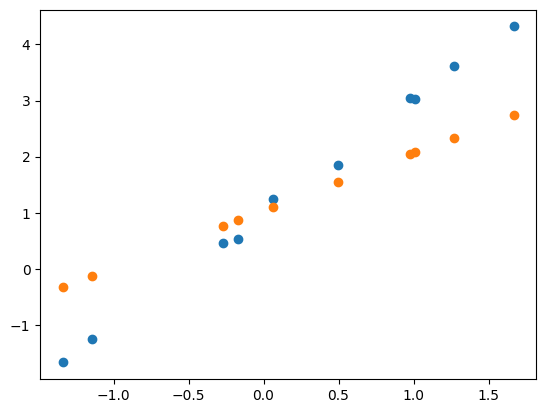

In [7]:
# EPOCH (first one!)
#Predict Y_hat and measure the Dtesp-Delta!!!

Y_hat = X @ W_predicted  + b_predicted
# print("y_hat= ", Y_hat)
# print("y_true= ", Y_true)
step_delta = Y_true - Y_hat
# print("step_delta= ", step_delta)
print("          X       Y_true     Y_Hat    Step_delta   ")
print(torch.cat((X, Y_true, Y_hat, step_delta), dim=1))

# Loss function == MSE
#mse = (step_delta ** 2).mean()
rmse = (step_delta ** 2).mean().sqrt()
print("RMSE= ", rmse.item())
#print("MSE= ", mse.item())

rmse.backward(create_graph=True, retain_graph=True)
print("W_predicted= ", W_predicted.item())
print("b_predicted= ", b_predicted.item())
print("W_Grad=", W_predicted.grad.item())
print("b_Grad=", b_predicted.grad.item())

# Make sure to reset grads before next iteration!
W_predicted.grad.zero_()
b_predicted.grad.zero_()

# jUST like the transpose of above.
# print(torch.stack((X, Y_true, Y_hat, step_delta), dim=1))

# Plot
## Clone Tensor for plotting, Else:
## ERROR: RuntimeError: Can't call numpy() on Tensor that requires grad. Use tensor.detach().numpy() instead.
## WARN: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor)
#Y_hat_plot = torch.tensor(Y_hat)
Y_hat_plot = Y_hat.clone().detach()

plt.scatter(x=X, y=Y_true, colorizer='r')
plt.scatter(x=X, y=Y_hat_plot, colorizer='y')
plt.plot()
pass

In [8]:
epochs = 100000
learning_rate = 0.01

# Rand Init W and b (already done previously!)
## W_predicted = torch.randn(1, 1, requires_grad=True, dtype=torch.float32)
## b_predicted = torch.randn(1, requires_grad=True, dtype=torch.float32)
#rmse = 10

for epoch in range(epochs):
    # print the Y_hat, RMSE
    if epoch % 10 == 0:
        rmse_log = ((Y_hat.detach() - Y_true.detach())**2).mean().sqrt()
        print(f"\n\nEpoch {epoch + 1}/{epochs} >> RMSE: {rmse_log}; \
            W_predicted={W_predicted.item():.4f}; b_predicted={b_predicted.item():.4f}")
        print(">> [Init] W_grad: ", W_predicted.grad)
        print(">> [Init] b_grad: ", b_predicted.grad)
        print("          X       Y_true     Y_Hat    Step_delta   ")
        print(torch.cat((X, Y_true, Y_hat, step_delta), dim=1))

    # Calculate Y_hat
    Y_hat = X @ W_predicted + b_predicted

    # Calculate RMSE
    step_delta = Y_true - Y_hat
    rsme = (step_delta ** 2).mean().sqrt()

    # Back-propagate
    rsme.backward()

    if epoch % 10 == 0:
        print(">> [Bw-pr] W_grad: ", W_predicted.grad)
        print(">> [Bw-pr] b_grad: ", b_predicted.grad)

    # Update W and b, based on their Grads
    with torch.no_grad():
        W_predicted -= learning_rate * W_predicted.grad
        b_predicted -= learning_rate * b_predicted.grad

    # Reset the grads for the next itr
    W_predicted.grad.zero_()
    b_predicted.grad.zero_()




Epoch 1/100000 >> RMSE: 0.9678057432174683;             W_predicted=1.0215; b_predicted=1.0430
>> [Init] W_grad:  tensor([[0.]], grad_fn=<ZeroBackward0>)
>> [Init] b_grad:  tensor([0.], grad_fn=<ZeroBackward0>)
          X       Y_true     Y_Hat    Step_delta   
tensor([[ 1.2689,  3.6105,  2.3393,  1.2713],
        [-0.1671,  0.5387,  0.8723, -0.3336],
        [-1.3383, -1.6661, -0.3240, -1.3420],
        [-1.1452, -1.2440, -0.1268, -1.1172],
        [ 1.6676,  4.3188,  2.7465,  1.5723],
        [ 1.0112,  3.0205,  2.0760,  0.9445],
        [ 0.0637,  1.2500,  1.1081,  0.1419],
        [ 0.4945,  1.8576,  1.5482,  0.3094],
        [-0.2719,  0.4628,  0.7653, -0.3025],
        [ 0.9762,  3.0493,  2.0403,  1.0090]], grad_fn=<CatBackward0>)
>> [Bw-pr] W_grad:  tensor([[-0.9869]], grad_fn=<ZeroBackward0>)
>> [Bw-pr] b_grad:  tensor([-0.2225], grad_fn=<ZeroBackward0>)


Epoch 11/100000 >> RMSE: 0.8762897253036499;             W_predicted=1.1201; b_predicted=1.0641
>> [Init] W_grad:  tenso

[]

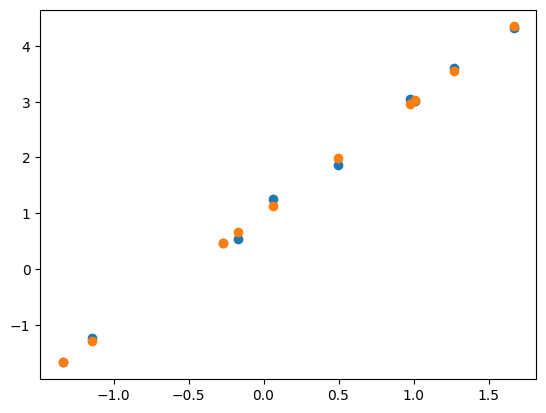

In [9]:
# Plot again
plt.scatter(x=X, y=Y_true, colorizer='r')
plt.scatter(x=X, y=Y_hat.detach(), colorizer='y')
plt.plot()


#### Consistent Observation
The predicted Y_hat now closely mimics the Y_true, however, somehow, the rmse of the predicted Y_hat is still close to 3.9

Possible Cause: The requires_grad might be interfering with the rmse when loggin. Use detach mode to recalculate the RMSE - now looks correct (i.e. converging to 0.0)

Calculating RMSE again, finally!

In [10]:
rmse_final = ((Y_hat.detach() - Y_true.detach())**2).mean().sqrt()
print("RMSE FINAL= ", rmse_final)

RMSE FINAL=  tensor(0.0806)


## Linear Regression (Neural Nets Lib)
Now use the same crafted data to use the NN library from torch, and compare the results!

### Demystifying `torch.nn.Linear`: Under the Hood

When building Neural Networks, the `nn.Linear` layer is the workhorse that performs the affine transformation. While standard textbooks define this as $y = Wx + b$, PyTorch processes data in **batches**, optimizing memory by using the following equation:

$$y = x A^T + b$$

---

#### 1. The Matrix Dimensions (The Anatomy)

Assume we define a layer as `layer = nn.Linear(in_features=3, out_features=2)` and pass in a batch of 4 samples.

* **The Input ($x$):** Shape is `[batch_size, in_features]`.
  * *Example:* `[4, 3]`. You have 4 rows of data, and each row has 3 features.
* **The Weight Matrix ($A$ or $W$):** Shape is `[out_features, in_features]`.
  * *Example:* `[2, 3]`. PyTorch stores the weights in this "wide" format. It has 2 rows (one for each output neuron) and 3 columns (one for each input feature).
* **The Bias Vector ($b$):** Shape is `[out_features]`.
  * *Example:* `[2]`. A 1D tensor with 2 numbers.

##### The 3-Step Calculation
1. **The Transpose:** PyTorch transposes its internal weight matrix from `[2, 3]` to `[3, 2]`.
2. **Matrix Multiplication:** It calculates the dot product of the input `[4, 3]` and the transposed weights `[3, 2]`, resulting in a `[4, 2]` matrix.
3. **Broadcasting:** It stretches the `[2]` bias vector across all 4 rows and adds it to the result.

---

#### 2. Where Do the Initial Numbers Come From?

When you instantiate the layer, PyTorch automatically fills the $W$ and $b$ matrices using a **Uniform Distribution** bounded by $\pm \frac{1}{\sqrt{\text{in\_features}}}$.

For `in_features = 3`, it picks random numbers between $-\frac{1}{\sqrt{3}}$ and $+\frac{1}{\sqrt{3}}$ (roughly -0.577 to +0.577). This prevents "exploding" or "vanishing" gradients on the very first day of training.

---

#### 3. Controlling Weights and Biases

Weights and biases are stored as `torch.nn.Parameter` objects. You have full control over how they are initialized.

### Option A: Built-in Initializers (The ML Way)
Use `torch.nn.init` to apply industry-standard techniques like Xavier/Glorot or Kaiming/He.

```python
import torch
import torch.nn as nn

layer = nn.Linear(3, 2)

### Overwrite weights with Xavier Normal (Great for Tanh/Sig
```
### Option B: Injecting Custom Matrices (For Debugging/Teaching)
You can force the layer to use exact numbers by modifying the .data directly inside a torch.no_grad() block.
```python
import torch
import torch.nn as nn

layer = nn.Linear(3, 2)

# Create custom matrices (Must match the expected shapes!)
custom_weights = torch.tensor([[1.0, 2.0, 3.0],
                               [4.0, 5.0, 6.0]])
custom_bias = torch.tensor([10.0, 20.0])

# Inject them directly
with torch.no_grad():
    layer.weight.copy_(custom_weights)
    layer.bias.copy_(custom_bias)
```
### Option C: Disabling the Bias Completely
If you are placing a Linear layer immediately before a Normalization layer (like BatchNorm), the bias is mathematically redundant. You can disable it entirely.
```python
# Create a layer with ONLY a weight matrix, no bias.
layer_no_bias = nn.Linear(in_features=3, out_features=2, bias=False)

print(layer_no_bias.bias) # Output: None
```

In [11]:
# Just a warm-up
import torch.nn as nn

# We have input as 3 dims, and output has 2 dims.
linear_layer = nn.Linear(3, 2)
print(linear_layer)
# 10 data points - each data-point ==> (x1, x2, x3)
input = torch.randn(10, 3)
print(f"Input 10x3: \n{input}")

# It does this: Y_hat = X.W^T + b
# Where Y_hat is the output matrix, and X is the input matrix
output = linear_layer(input)

print(f"Output 10X2: \n{output}")
print(output.size())

print()
# Now let's Inspect the internal matrices PyTorch created
print("Weight shape (W):", linear_layer.weight.shape)
print(f"Weight (W): {linear_layer.weight}")
print()
print("Bias shape (b):", linear_layer.bias.shape)
print(f"Bias (b): {linear_layer.bias}")
# Output: torch.Size([2])

# Let's now understand the weights, and biases (W, b)
linear_layer.weight


Linear(in_features=3, out_features=2, bias=True)
Input 10x3: 
tensor([[ 1.2151, -0.6536, -1.2077],
        [ 0.5534,  1.0738,  1.8339],
        [ 0.5169,  0.6129,  1.3827],
        [-1.7776,  1.6369, -1.3040],
        [ 2.0588, -0.0148,  0.4230],
        [-1.7210,  0.1477,  0.8813],
        [-0.3459,  0.1377,  0.0753],
        [-0.9452,  0.0290,  0.3233],
        [ 0.1682,  1.0915, -1.7807],
        [-1.5733, -0.6004, -0.1581]])
Output 10X2: 
tensor([[ 0.3458,  1.3309],
        [ 1.4228, -1.1042],
        [ 1.2466, -0.6654],
        [-0.9977, -0.3172],
        [ 1.3564,  0.3891],
        [ 0.3217, -0.6049],
        [ 0.3700,  0.0370],
        [ 0.3124, -0.1371],
        [-0.5235,  0.5400],
        [-0.0508,  0.2916]], grad_fn=<AddmmBackward0>)
torch.Size([10, 2])

Weight shape (W): torch.Size([2, 3])
Weight (W): Parameter containing:
tensor([[ 0.3289, -0.1358,  0.5027],
        [ 0.1837, -0.4996, -0.4769]], requires_grad=True)

Bias shape (b): torch.Size([2])
Bias (b): Parameter contai

Parameter containing:
tensor([[ 0.3289, -0.1358,  0.5027],
        [ 0.1837, -0.4996, -0.4769]], requires_grad=True)

### Let's begin: The Neural Nets!

In [12]:


class MyNnLinearRegr(nn.Module):
    def __init__(self, in_features, out_features):
        super().__init__()
        self.lin = nn.Linear(in_features, out_features)

    def forward(self, x):
        return self.lin(x)

    def extra_repr(self):
        super().extra_repr()

nn_model = MyNnLinearRegr(1, 1)
# nn_model.register_backward_hook(lambda x: print(" <<<< ", x))
print(nn_model)
print(list(nn_model.parameters()))
print(nn_model(X))



MyNnLinearRegr(
  (lin): Linear(in_features=1, out_features=1, bias=True)
)
[Parameter containing:
tensor([[0.7197]], requires_grad=True), Parameter containing:
tensor([-0.7618], requires_grad=True)]
tensor([[ 0.1514],
        [-0.8820],
        [-1.7249],
        [-1.5859],
        [ 0.4384],
        [-0.0341],
        [-0.7159],
        [-0.4059],
        [-0.9574],
        [-0.0592]], grad_fn=<AddmmBackward0>)


In [13]:
from torch import optim

opti = optim.Adam(nn_model.parameters(), lr=0.01)
loss_fn = nn.MSELoss()
#loss_fn.register_backward_hook(lambda x: print(" >>>> ", x))

In [14]:
epochs = 10000

for epoch in range(epochs):
    Y_hat = nn_model(X)

    # The y_hat holds the refs of all the grad-tree
    # and now the loss is the new leaf of the grad-tree!
    # print(Y_hat)
    # print(Y_true)
    loss = loss_fn(Y_hat, Y_true)

    # Optimizer holds a ref to the nn_model.parameters()
    # Thus its able to reset the grads of the params (or the entire graph).
    opti.zero_grad()

    # Back propagate the error through the grad-tree
    loss.backward()

    # Opti knows what params to upgrade, using the corresponding grads
    opti.step()

    if epoch % 10 == 0:
        print(f"Epoch {epoch + 1}/{epochs} >> loss: {loss.item():.4f}")
        print(f"Parameters: {list(nn_model.parameters())}")



Epoch 1/10000 >> loss: 5.9161
Parameters: [Parameter containing:
tensor([[0.7297]], requires_grad=True), Parameter containing:
tensor([-0.7518], requires_grad=True)]
Epoch 11/10000 >> loss: 5.1804
Parameters: [Parameter containing:
tensor([[0.8293]], requires_grad=True), Parameter containing:
tensor([-0.6520], requires_grad=True)]
Epoch 21/10000 >> loss: 4.5026
Parameters: [Parameter containing:
tensor([[0.9275]], requires_grad=True), Parameter containing:
tensor([-0.5535], requires_grad=True)]
Epoch 31/10000 >> loss: 3.8870
Parameters: [Parameter containing:
tensor([[1.0231]], requires_grad=True), Parameter containing:
tensor([-0.4571], requires_grad=True)]
Epoch 41/10000 >> loss: 3.3349
Parameters: [Parameter containing:
tensor([[1.1151]], requires_grad=True), Parameter containing:
tensor([-0.3635], requires_grad=True)]
Epoch 51/10000 >> loss: 2.8445
Parameters: [Parameter containing:
tensor([[1.2031]], requires_grad=True), Parameter containing:
tensor([-0.2731], requires_grad=True)]

In [15]:
# in_features and out_features both are 1, for our crafted data.
# Definitions & Overriding
from torch.nn import Module
from torch.nn import RNN
from torch.nn import ReLU
from torch.nn import GELU

lin = torch.nn.Linear(in_features=1, out_features=1, bias=True, dtype=torch.float32)
print(lin)

Linear(in_features=1, out_features=1, bias=True)


[]

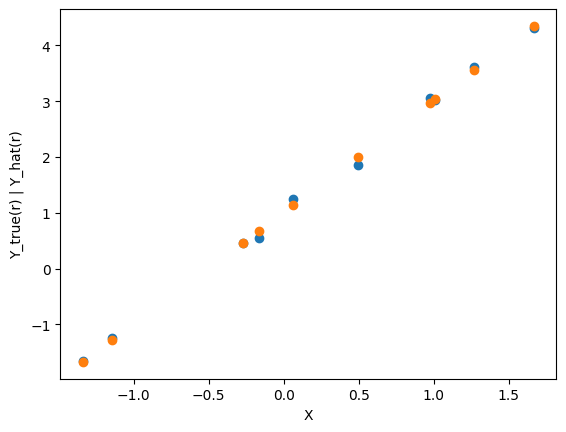

In [16]:
# Now plot
plt.xlabel('X')
plt.ylabel('Y_true(r) | Y_hat(r)')
plt.scatter(x=X, y=Y_true, colorizer='r')
plt.scatter(x=X, y=Y_hat.detach(), colorizer='')
plt.plot()